In [1]:
import os, random, cv2
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from torchvision import transforms

In [2]:
# ========== 1. EXPLORE DATASET STRUCTURE ==========
data_path = "../archive"

dirs = sorted(os.listdir(data_path))
print(dirs)
train_dir = os.path.join(data_path, dirs[1])
test_dir  = os.path.join(data_path, dirs[0])

train_classes = sorted(os.listdir(train_dir))
test_classes  = sorted(os.listdir(test_dir))

print("Les classes de Training :", train_classes)
print("Les classes de Test     :", test_classes)

def count_images_in_folder(folder):
    counts = {}
    for cls in sorted(os.listdir(folder)):
        cls_dir = os.path.join(folder, cls)
        files = [f for f in os.listdir(cls_dir)
                 if f.lower().endswith(('.png','.jpg','.jpeg'))]
        counts[cls] = len(files)
    return counts

train_counts = count_images_in_folder(train_dir)
test_counts  = count_images_in_folder(test_dir)

print("Training set:\n", train_counts)
print("Testing set:\n", test_counts)

['Testing', 'Training']
Les classes de Training : ['glioma', 'meningioma', 'notumor', 'pituitary']
Les classes de Test     : ['glioma', 'meningioma', 'notumor', 'pituitary']
Training set:
 {'glioma': 1321, 'meningioma': 1339, 'notumor': 1595, 'pituitary': 1457}
Testing set:
 {'glioma': 300, 'meningioma': 306, 'notumor': 405, 'pituitary': 300}


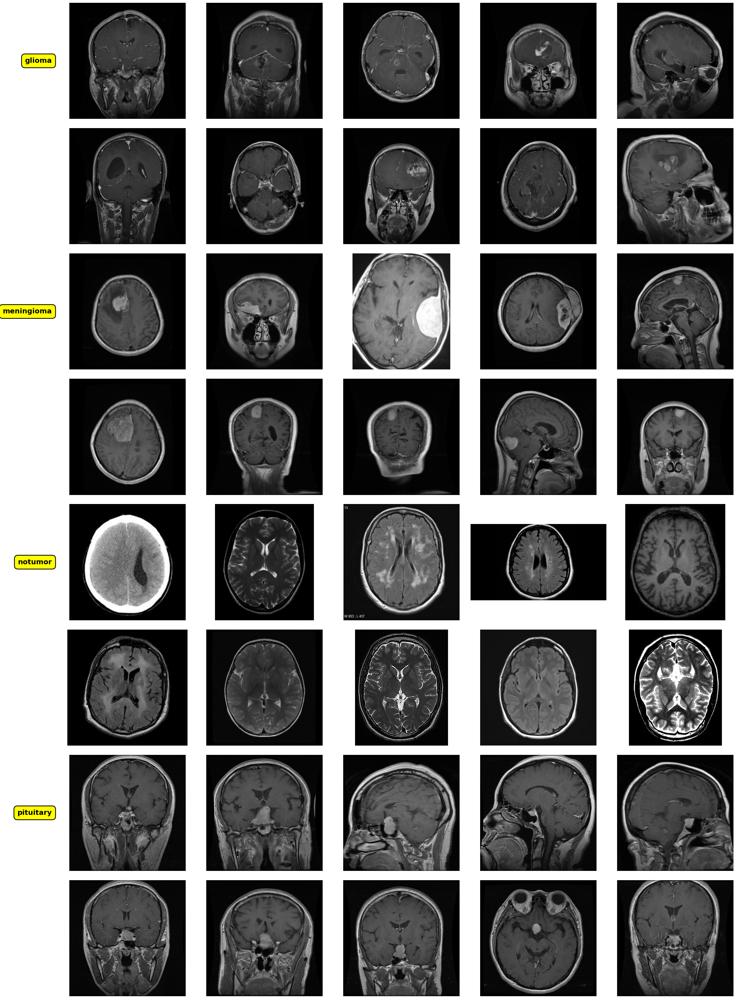

In [7]:
# ========== 2. SAMPLE 10 IMAGES PER TRAIN CLASS ==========
sampled_images = {}
for cls in train_classes:
    cls_dir = os.path.join(train_dir, cls)
    files = [f for f in os.listdir(cls_dir)
             if f.lower().endswith(('.png','.jpg','.jpeg'))]
    sampled = random.sample(files, min(10, len(files)))
    sampled_images[cls] = [os.path.join(cls_dir, f) for f in sampled]

# ========== 3. VISUALIZE RAW SAMPLES (NO TITLE - MAXIMUM IMAGE SIZE) ==========
num_classes = len(train_classes)
num_rows = num_classes * 2
num_cols = 5

fig, axes = plt.subplots(num_rows, num_cols, figsize=(25, num_rows * 4.5))

for i, cls in enumerate(train_classes):
    # First row (images 0-4)
    row1 = i * 2
    for j in range(5):
        if j < len(sampled_images[cls]):
            img = Image.open(sampled_images[cls][j])
            axes[row1, j].imshow(img, cmap='gray')
            axes[row1, j].axis('off')
            if j == 0:
                # Bigger, bolder class label
                axes[row1, j].text(-0.15, 0.5, cls,
                                  transform=axes[row1, j].transAxes,
                                  fontsize=18, fontweight='bold',
                                  va='center', ha='right',
                                  bbox=dict(boxstyle='round,pad=0.5',
                                          facecolor='yellow',
                                          edgecolor='black',
                                          linewidth=2))
    
    # Second row (images 5-9)
    row2 = i * 2 + 1
    for j in range(5):
        idx = j + 5
        if idx < len(sampled_images[cls]):
            img = Image.open(sampled_images[cls][idx])
            axes[row2, j].imshow(img, cmap='gray')
            axes[row2, j].axis('off')

# ZERO padding - images take ALL available space
plt.subplots_adjust(left=0.02, right=0.99, top=0.99, bottom=0.01,
                   wspace=0.01, hspace=0.08)
plt.show()

In [23]:
# ======= PREPROCESSING FUNCTIONS =======

def crop_black(img):
    """Crop black borders around the brain area."""
    coords = cv2.findNonZero(img)
    if coords is None:
        return img
    x, y, w, h = cv2.boundingRect(coords)
    return img[y:y+h, x:x+w]

def preprocess_image(img_path,  target_size=(224, 224)):
    """Full preprocessing pipeline for one image."""
    # 1. Read grayscale
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    if img is None:
        return None

    # 2. Crop black borders
    img = crop_black(img)

    # 3. CLAHE contrast enhancement
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    img = clahe.apply(img)

    # 4. Bilateral denoising
    img = cv2.bilateralFilter(img, d=5, sigmaColor=20, sigmaSpace=50)

    '''# 5. Adaptive Gaussian thresholding (with Otsu-like local adaptation)
    img = cv2.adaptiveThreshold(
        img, 255,
        cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY,
        blockSize=11, C=2
    )'''

    # 5. Resize to target size
    img = cv2.resize(img, target_size, interpolation=cv2.INTER_AREA)
    
    # 6. Normalize to [0, 1]
    img = img.astype(np.float32) / 255.0
    
    return img

# ======= PROCESS SAMPLED IMAGES =======

def visualize_processed_samples(sampled_images):
    """Apply preprocessing to the sampled images and visualize results."""
    num_classes = len(sampled_images)
    num_rows = num_classes * 2
    num_cols = 5

    fig, axes = plt.subplots(num_rows, num_cols, figsize=(25, num_rows * 4.5))

    for i, (cls, paths) in enumerate(sampled_images.items()):
        row1, row2 = i * 2, i * 2 + 1
        # first 5
        for j in range(5):
            if j < len(paths):
                proc = preprocess_image(paths[j])
                axes[row1, j].imshow(proc, cmap='gray')
                axes[row1, j].axis('off')
                if j == 0:
                    axes[row1, j].text(-0.15, 0.5, cls,
                        transform=axes[row1, j].transAxes,
                        fontsize=18, fontweight='bold',
                        va='center', ha='right',
                        bbox=dict(boxstyle='round,pad=0.5',
                                  facecolor='yellow',
                                  edgecolor='black',
                                  linewidth=2))
        # next 5
        for j in range(5):
            idx = j + 5
            if idx < len(paths):
                proc = preprocess_image(paths[idx])
                axes[row2, j].imshow(proc, cmap='gray')
                axes[row2, j].axis('off')

    plt.subplots_adjust(left=0.02, right=0.99, top=0.99, bottom=0.01,
                        wspace=0.01, hspace=0.08)
    plt.show()


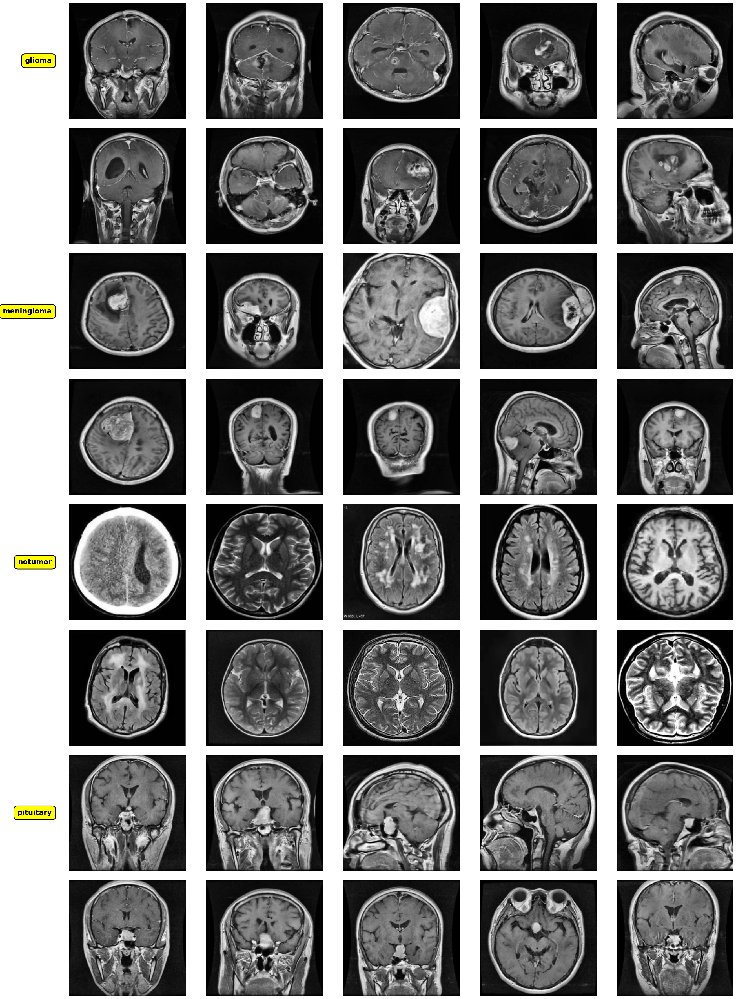

In [24]:
visualize_processed_samples(sampled_images)